      Tenure  CityTier  WarehouseToHome  HourSpendOnApp  \
0   6.858098  2.961367        15.973254        2.920505   
1  22.049007  1.476821        14.948344        2.803974   
2   6.596193  1.076818        13.331067        2.511897   
3   7.890855  1.056047        17.143068        3.424041   
4  12.339031  1.707977        15.304843        3.042735   

   NumberOfDeviceRegistered  SatisfactionScore  OrderAmountHikeFromlastYear  \
0                  3.757058           2.992571                    15.346954   
1                  3.617219           2.989404                    15.033113   
2                  2.982325           3.118967                    14.922502   
3                  4.356932           3.064897                    17.146018   
4                  3.826211           3.186610                    15.349003   

   CouponUsed  OrderCount  DaySinceLastOrder  CashbackAmount  
0    1.216196    2.130758           3.597325      168.239629  
1    1.421192    2.698013           6.045033

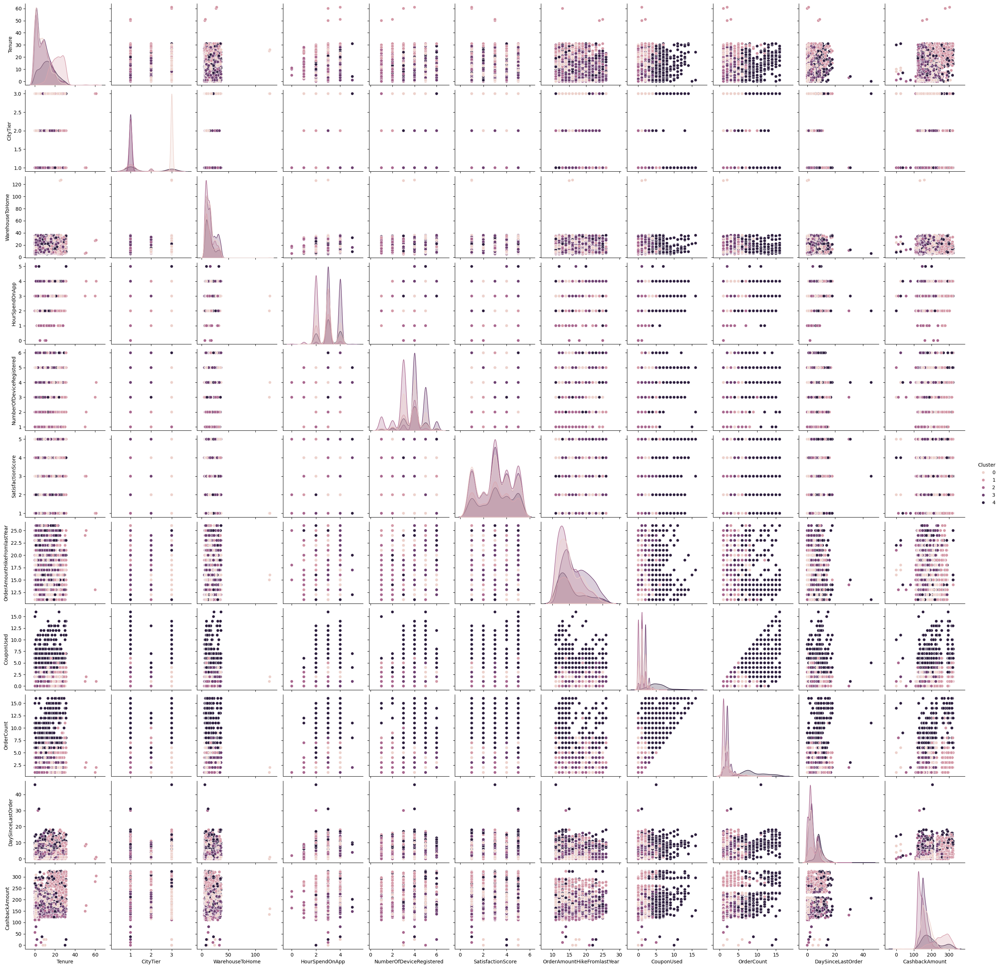

In [5]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer

# Cargar el archivo de datos usando 'with'
file_path = '/Users/Abraham/iCloud Drive (Archive)/Documents/ML-Python/E_Commerce_Dataset.xlsx'

with pd.ExcelFile(file_path, engine='openpyxl') as xls:
    Ecomm = pd.read_excel(xls, sheet_name='E Comm')

# Imputar los valores faltantes
imputer = SimpleImputer(strategy='most_frequent')  
Ecomm_imputed = pd.DataFrame(imputer.fit_transform(Ecomm), columns=Ecomm.columns)

# Aplicar One-Hot Encoding a la columna PreferredLoginDevice
Ecomm_encoded = pd.get_dummies(Ecomm_imputed, columns=['PreferredLoginDevice'])

# Seleccionar las características relevantes para el clustering
selected_features = [
    'Tenure', 'CityTier', 'WarehouseToHome', 'HourSpendOnApp', 
    'NumberOfDeviceRegistered', 'SatisfactionScore', 'OrderAmountHikeFromlastYear', 
    'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'
]

# Estandarización de datos
scaler = StandardScaler()
Ecomm_scaled = scaler.fit_transform(Ecomm_encoded[selected_features])

# Aplicación de K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(Ecomm_scaled)

# Añadir los clusters al DataFrame original
Ecomm['Cluster'] = clusters

# Insights de cada cluster
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=selected_features)
print(cluster_centers_df)

# Visualización de clusters
sns.pairplot(Ecomm, hue='Cluster', vars=selected_features)
plt.show()

      Tenure  CityTier  WarehouseToHome  HourSpendOnApp  \
0   5.936475  1.836066        14.547131        2.401639   
1   8.421136  1.984227        16.611987        3.075710   
2  20.506780  1.467797        17.362712        2.945763   
3   4.566434  1.534965        15.638112        3.437937   
4  10.855814  1.797674        15.239535        2.990698   

   NumberOfDeviceRegistered  SatisfactionScore  OrderAmountHikeFromlastYear  \
0                  2.964139           3.020492                    14.456967   
1                  3.774448           2.867508                    16.209779   
2                  3.735593           2.994915                    15.884746   
3                  4.444056           3.198427                    16.498252   
4                  3.706977           3.123256                    15.634884   

   CouponUsed  OrderCount  DaySinceLastOrder  CashbackAmount  
0    0.738730    1.470287           3.141393      152.200881  
1    1.559937    3.173502           8.345426

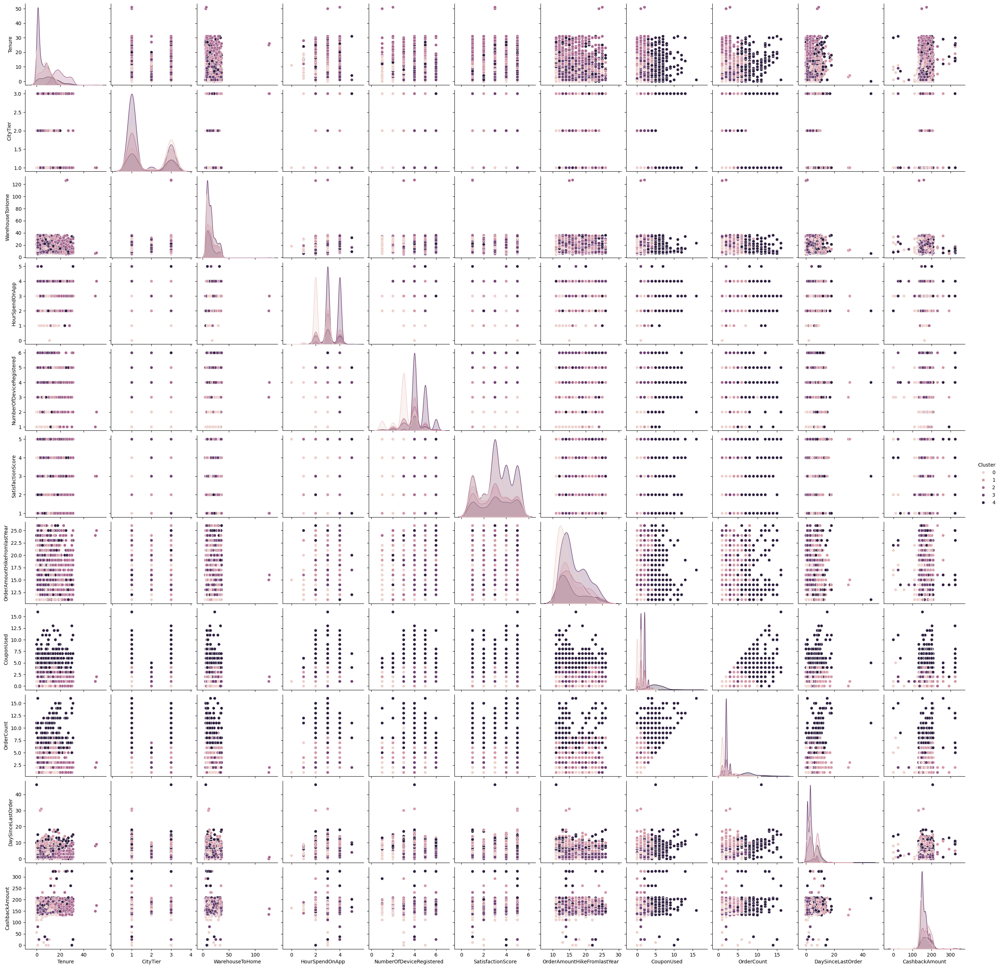

In [6]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar el archivo de datos
file_path = '/Users/Abraham/iCloud Drive (Archive)/Documents/ML-Python/E_Commerce_Dataset.xlsx'
with pd.ExcelFile(file_path, engine='openpyxl') as xls:
    Ecomm = pd.read_excel(xls, sheet_name='E Comm')
Ecomm = Ecomm.dropna()

# Aplicar One-Hot Encoding a la columna PreferredLoginDevice
Ecomm_encoded = pd.get_dummies(Ecomm, columns=['PreferredLoginDevice'])

# Seleccionar las características relevantes para el clustering
selected_features = [
    'Tenure', 'CityTier', 'WarehouseToHome', 'HourSpendOnApp', 
    'NumberOfDeviceRegistered', 'SatisfactionScore', 'OrderAmountHikeFromlastYear', 
    'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'
]

# Estandarización de datos
scaler = StandardScaler()
Ecomm_scaled = scaler.fit_transform(Ecomm_encoded[selected_features])

# Aplicación de K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(Ecomm_scaled)

# Añadir los clusters al DataFrame original
Ecomm['Cluster'] = clusters

# Insights de cada cluster
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=selected_features)
print(cluster_centers_df)

# Visualización de clusters
sns.pairplot(Ecomm, hue='Cluster', vars=selected_features)
plt.show()

Centroides de cada cluster:
      Tenure  CityTier  WarehouseToHome  HourSpendOnApp  \
0   5.936475  1.836066        14.547131        2.401639   
1   8.421136  1.984227        16.611987        3.075710   
2  20.506780  1.467797        17.362712        2.945763   
3   4.566434  1.534965        15.638112        3.437937   
4  10.855814  1.797674        15.239535        2.990698   

   NumberOfDeviceRegistered  SatisfactionScore  OrderAmountHikeFromlastYear  \
0                  2.964139           3.020492                    14.456967   
1                  3.774448           2.867508                    16.209779   
2                  3.735593           2.994915                    15.884746   
3                  4.444056           3.198427                    16.498252   
4                  3.706977           3.123256                    15.634884   

   CouponUsed  OrderCount  DaySinceLastOrder  CashbackAmount  
0    0.738730    1.470287           3.141393      152.200881  
1    1.559937   

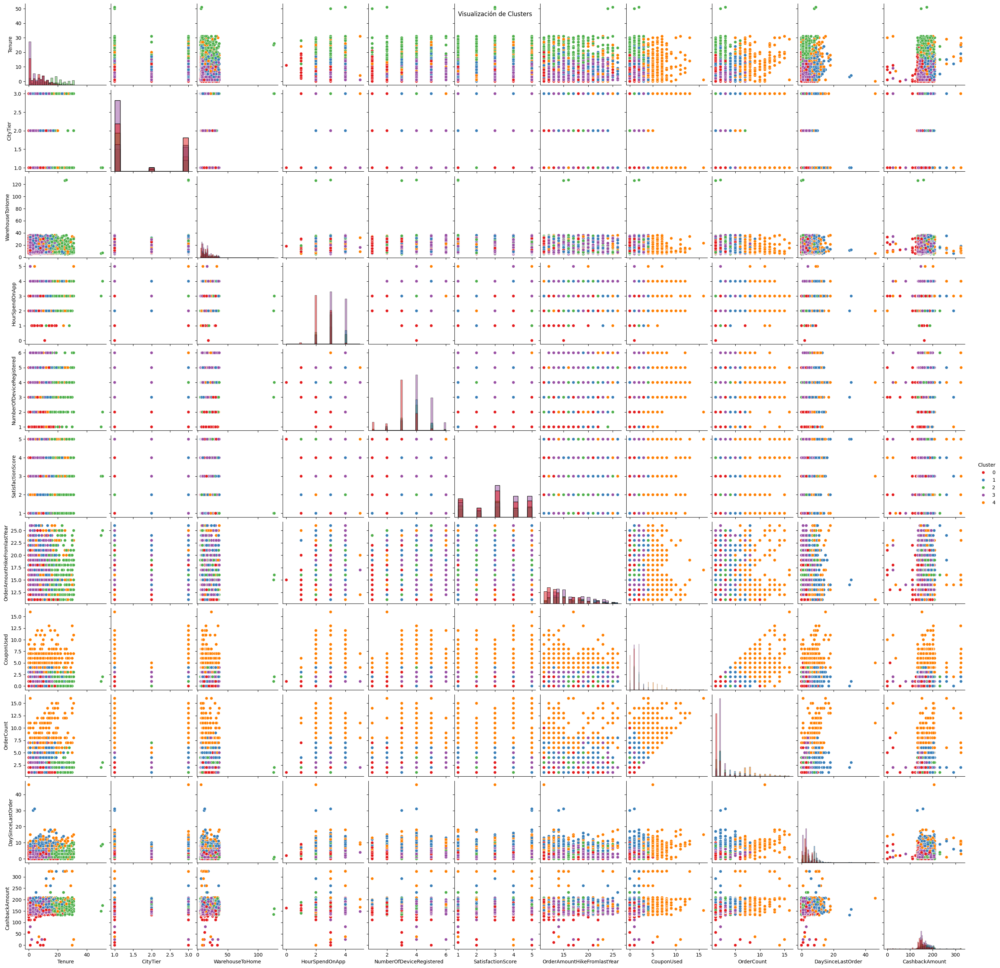

In [12]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

# Cargar el archivo de datos
file_path = '/Users/Abraham/iCloud Drive (Archive)/Documents/ML-Python/E_Commerce_Dataset.xlsx'
try:
    with pd.ExcelFile(file_path, engine='openpyxl') as xls:
        Ecomm = pd.read_excel(xls, sheet_name='E Comm')
        Ecomm = Ecomm.dropna()
except Exception as e:
    print("Error al cargar el archivo:", e)
    exit()

# Verificar que los datos se han cargado correctamente
if Ecomm.empty:
    print("El DataFrame está vacío. Revise el archivo de datos.")
    exit()

# Seleccionar las características relevantes para el clustering
selected_features = [
    'Tenure', 'CityTier', 'WarehouseToHome', 'HourSpendOnApp', 
    'NumberOfDeviceRegistered', 'SatisfactionScore', 'OrderAmountHikeFromlastYear', 
    'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'
]

# Estandarización de datos
scaler = StandardScaler()
Ecomm_scaled = scaler.fit_transform(Ecomm[selected_features])

# Aplicación de K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(Ecomm_scaled)

# Añadir los clusters al DataFrame original
Ecomm['Cluster'] = clusters

# Insights de cada cluster
cluster_centers_df = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=selected_features)
print("Centroides de cada cluster:")
print(cluster_centers_df)

# Calcular la inercia (suma de las distancias al cuadrado de las muestras a su centroide más cercano)
inertia = kmeans.inertia_
print("Inercia del modelo de clustering:", inertia)

# Calcular el coeficiente de silueta (un valor cercano a 1 indica una buena separación entre clusters)
silhouette_score = metrics.silhouette_score(Ecomm_scaled, clusters)
print("Coeficiente de silueta:", silhouette_score)

# Visualización de clusters
sns.pairplot(Ecomm, hue='Cluster', vars=selected_features, diag_kind='hist', palette='Set1')
plt.suptitle('Visualización de Clusters')
plt.show()


Centroides de cada cluster:
      Tenure  CityTier  WarehouseToHome  HourSpendOnApp  \
0   6.858098  2.961367        15.973254        2.920505   
1  22.049007  1.476821        14.948344        2.803974   
2   6.596193  1.076818        13.331067        2.511897   
3   7.890855  1.056047        17.143068        3.424041   
4  12.339031  1.707977        15.304843        3.042735   

   NumberOfDeviceRegistered  SatisfactionScore  OrderAmountHikeFromlastYear  \
0                  3.757058           2.992571                    15.346954   
1                  3.617219           2.989404                    15.033113   
2                  2.982325           3.118967                    14.922502   
3                  4.356932           3.064897                    17.146018   
4                  3.826211           3.186610                    15.349003   

   CouponUsed  OrderCount  DaySinceLastOrder  CashbackAmount  
0    1.216196    2.130758           3.597325      168.239629  
1    1.421192   

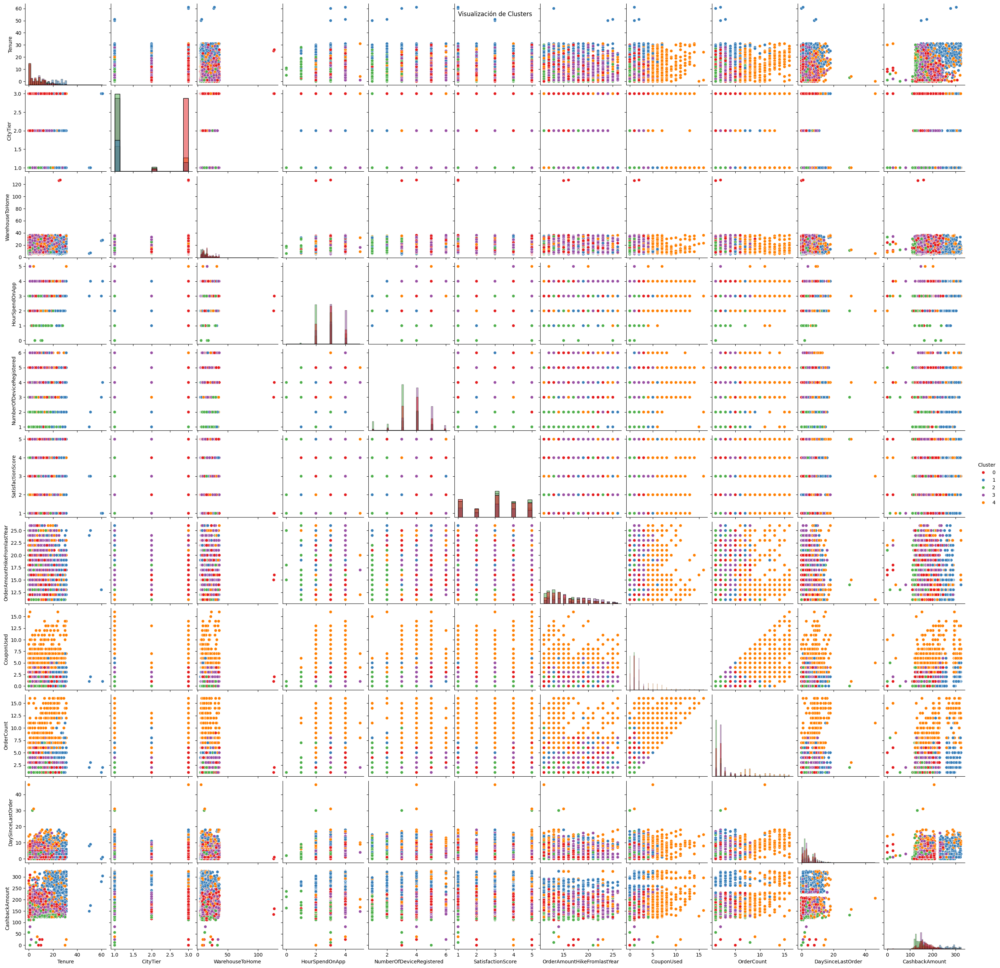

In [13]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

# Cargar el archivo de datos
file_path = '/Users/Abraham/iCloud Drive (Archive)/Documents/ML-Python/E_Commerce_Dataset.xlsx'
try:
    with pd.ExcelFile(file_path, engine='openpyxl') as xls:
        Ecomm = pd.read_excel(xls, sheet_name='E Comm')
except Exception as e:
    print("Error al cargar el archivo:", e)
    exit()

# Verificar que los datos se han cargado correctamente
if Ecomm.empty:
    print("El DataFrame está vacío. Revise el archivo de datos.")
    exit()

# Imputar los valores faltantes
imputer = SimpleImputer(strategy='most_frequent')  
Ecomm_imputed = pd.DataFrame(imputer.fit_transform(Ecomm), columns=Ecomm.columns)

# Seleccionar las características relevantes para el clustering
selected_features = [
    'Tenure', 'CityTier', 'WarehouseToHome', 'HourSpendOnApp', 
    'NumberOfDeviceRegistered', 'SatisfactionScore', 'OrderAmountHikeFromlastYear', 
    'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'
]

# Estandarización de datos
scaler = StandardScaler()
Ecomm_scaled = scaler.fit_transform(Ecomm_imputed[selected_features])

# Aplicación de K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(Ecomm_scaled)

# Añadir los clusters al DataFrame original
Ecomm['Cluster'] = clusters

# Insights de cada cluster
cluster_centers_df = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=selected_features)
print("Centroides de cada cluster:")
print(cluster_centers_df)

# Calcular la inercia (suma de las distancias al cuadrado de las muestras a su centroide más cercano)
inertia = kmeans.inertia_
print("Inercia del modelo de clustering:", inertia)

# Calcular el coeficiente de silueta (un valor cercano a 1 indica una buena separación entre clusters)
silhouette_score = metrics.silhouette_score(Ecomm_scaled, clusters)
print("Coeficiente de silueta:", silhouette_score)

# Visualización de clusters
sns.pairplot(Ecomm, hue='Cluster', vars=selected_features, diag_kind='hist', palette='Set1')
plt.suptitle('Visualización de Clusters')
plt.show()

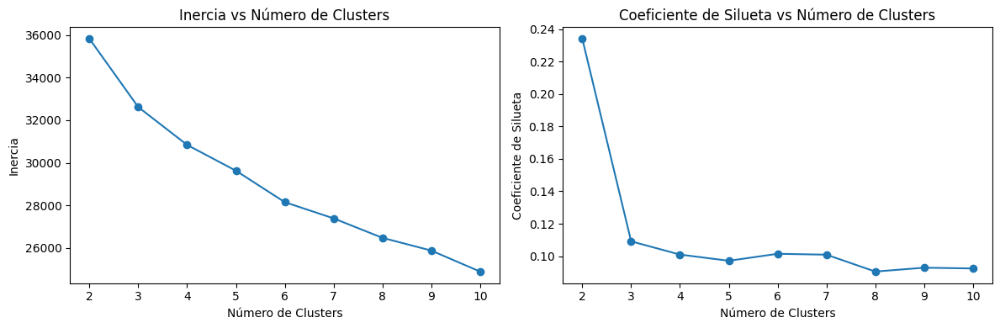

Inercia del modelo de clustering: 27394.965934604283
Coeficiente de silueta: 0.10094350327814564
Centroides de cada cluster:
      Tenure  CityTier  WarehouseToHome  HourSpendOnApp  \
0   6.586957  1.124224        14.271739        2.428571   
1  10.366822  1.490654        17.079439        3.371495   
2  21.813449  1.377440        16.444685        2.917570   
3   4.654350  1.078665        15.601907        3.421931   
4  12.363281  1.820312        14.976562        3.187500   
5   8.297735  1.906149        15.851133        2.540453   
6   5.681004  2.972521        16.144564        2.899642   

   NumberOfDeviceRegistered  SatisfactionScore  OrderAmountHikeFromlastYear  \
0                  2.770186           2.998447                    14.970497   
1                  4.030374           3.238318                    16.077103   
2                  3.689805           2.913232                    15.872017   
3                  4.476758           3.188319                    16.642431   
4      

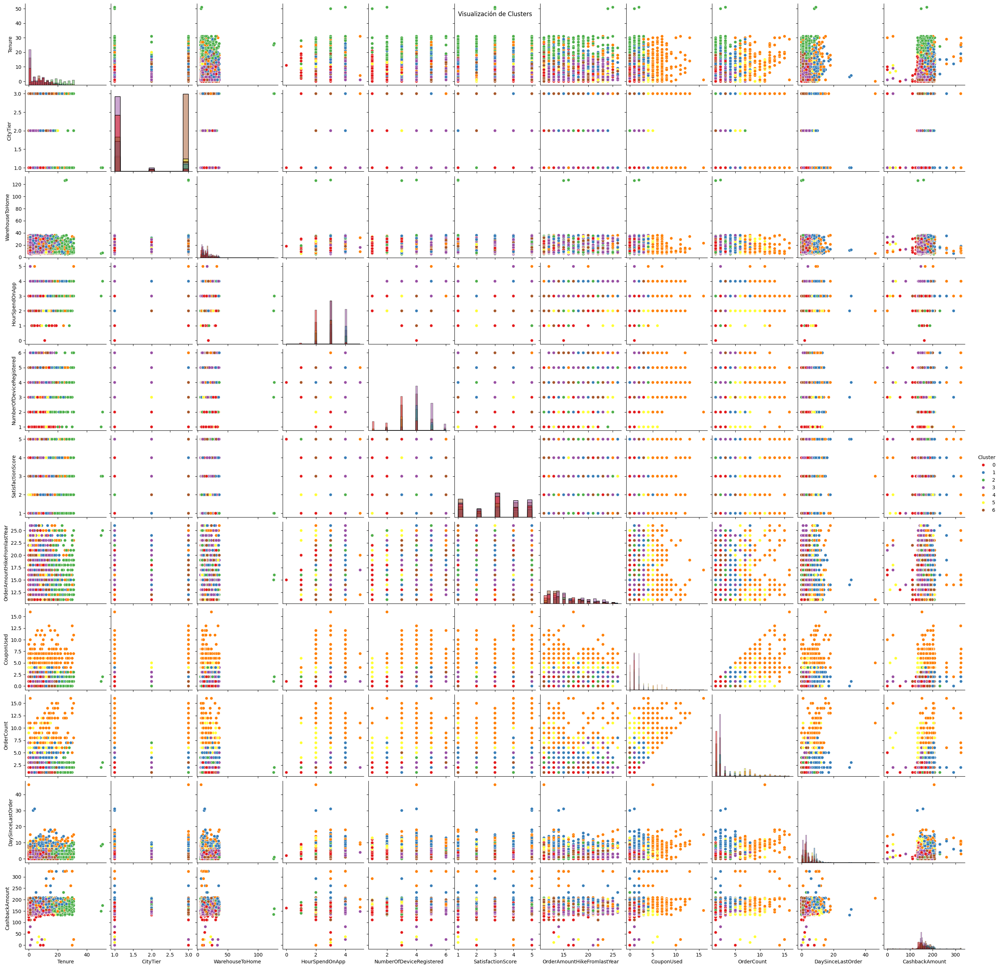

In [21]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar el archivo de datos
file_path = '/Users/Abraham/iCloud Drive (Archive)/Documents/ML-Python/E_Commerce_Dataset.xlsx'
try:
    with pd.ExcelFile(file_path, engine='openpyxl') as xls:
        Ecomm = pd.read_excel(xls, sheet_name='E Comm')
        Ecomm.dropna(inplace=True)
except Exception as e:
    print("Error al cargar el archivo:", e)
    exit()

# Verificar que los datos se han cargado correctamente
if Ecomm.empty:
    print("El DataFrame está vacío. Revise el archivo de datos.")
    exit()

# Seleccionar las características relevantes para el clustering
selected_features = [
    'Tenure', 'CityTier', 'WarehouseToHome', 'HourSpendOnApp', 
    'NumberOfDeviceRegistered', 'SatisfactionScore', 'OrderAmountHikeFromlastYear', 
    'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'
]

# Estandarización de datos
scaler = StandardScaler()
Ecomm_scaled = scaler.fit_transform(Ecomm[selected_features])

# Buscar el número óptimo de clusters
inertia_values = []
silhouette_scores = []
for n_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(Ecomm_scaled)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(metrics.silhouette_score(Ecomm_scaled, clusters))

# Graficar la inercia y el coeficiente de silueta para diferentes números de clusters
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(range(2, 11), inertia_values, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Inercia')
plt.title('Inercia vs Número de Clusters')

plt.subplot(1, 2, 2)
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Coeficiente de Silueta')
plt.title('Coeficiente de Silueta vs Número de Clusters')
plt.tight_layout()
plt.show()

# Selección del número óptimo de clusters basado en los gráficos (ejemplo: n_clusters=5)
n_clusters_optimo = 7

# Aplicación de K-Means clustering con el número óptimo de clusters
kmeans = KMeans(n_clusters=n_clusters_optimo, random_state=42)
clusters = kmeans.fit_predict(Ecomm_scaled)

# Añadir los clusters al DataFrame original
Ecomm['Cluster'] = clusters

# Calcular métricas de evaluación
inertia = kmeans.inertia_
silhouette_score = metrics.silhouette_score(Ecomm_scaled, clusters)

print("Inercia del modelo de clustering:", inertia)
print("Coeficiente de silueta:", silhouette_score)

# Insights de cada cluster
cluster_centers_df = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=selected_features)
print("Centroides de cada cluster:")
print(cluster_centers_df)

# Visualización de clusters
sns.pairplot(Ecomm, hue='Cluster', vars=selected_features, diag_kind='hist', palette='Set1')
plt.suptitle('Visualización de Clusters')
plt.show()


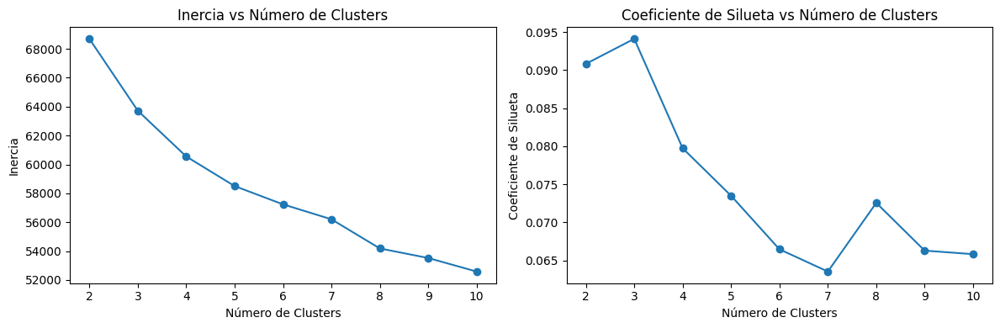

In [2]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer

# Cargar el archivo de datos
file_path = '/Users/Abraham/iCloud Drive (Archive)/Documents/ML-Python/E_Commerce_Dataset.xlsx'
try:
    with pd.ExcelFile(file_path, engine='openpyxl') as xls:
        Ecomm = pd.read_excel(xls, sheet_name='E Comm')
        Ecomm.dropna(inplace=True)
except Exception as e:
    print("Error al cargar el archivo:", e)
    exit()

# Verificar que los datos se han cargado correctamente
if Ecomm.empty:
    print("El DataFrame está vacío. Revise el archivo de datos.")
    exit()

# Imputar los valores faltantes
imputer = SimpleImputer(strategy='most_frequent')  
Ecomm_imputed = pd.DataFrame(imputer.fit_transform(Ecomm), columns=Ecomm.columns)

# Aplicar Label Encoding a las columnas no numéricas
non_numeric_columns = Ecomm_imputed.select_dtypes(exclude=['float64', 'int64']).columns
label_encoder = LabelEncoder()
for column in non_numeric_columns:
    Ecomm_imputed[column] = label_encoder.fit_transform(Ecomm_imputed[column])

# Seleccionar las características relevantes para el clustering
selected_features = [
    'CustomerID', 'Churn', 'Tenure', 'PreferredLoginDevice', 'CityTier',
       'WarehouseToHome', 'PreferredPaymentMode', 'Gender', 'HourSpendOnApp',
       'NumberOfDeviceRegistered', 'PreferedOrderCat', 'SatisfactionScore',
       'MaritalStatus', 'NumberOfAddress', 'Complain',
       'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount'
]

# Estandarización de datos
scaler = StandardScaler()
Ecomm_scaled = scaler.fit_transform(Ecomm_imputed[selected_features])

# Buscar el número óptimo de clusters
inertia_values = []
silhouette_scores = []
for n_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(Ecomm_scaled)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(metrics.silhouette_score(Ecomm_scaled, clusters))

# Graficar la inercia y el coeficiente de silueta para diferentes números de clusters
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(range(2, 11), inertia_values, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Inercia')
plt.title('Inercia vs Número de Clusters')

plt.subplot(1, 2, 2)
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Coeficiente de Silueta')
plt.title('Coeficiente de Silueta vs Número de Clusters')
plt.tight_layout()
plt.show()


Inercia del modelo de clustering: 54183.850000979975
Coeficiente de silueta: 0.07256813266535433
Centroides de cada cluster:
    CustomerID         Churn     Tenure  PreferredLoginDevice  CityTier  \
0   874.790224  2.851324e-02  11.065173              0.535642  0.018330   
1  2754.781984  2.480418e-02  11.459530              0.714099  0.857702   
2   849.577206  1.397059e-01   9.253676              0.882353  0.974265   
3  2710.683995 -7.494005e-16   7.857729              0.958960  0.265390   
4   872.970223  8.684864e-02   7.682382              1.975186  0.488834   
5   953.292627  1.359447e-01   8.419355              0.645161  1.953917   
6  2294.297235  1.000000e+00   2.290323              0.898618  0.737327   
7  2494.279835  1.316872e-01  11.818930              0.711934  0.744856   

   WarehouseToHome  PreferredPaymentMode    Gender  HourSpendOnApp  \
0        10.258656              3.460285  0.602851        2.399185   
1        11.312010              3.920366  0.563969        3

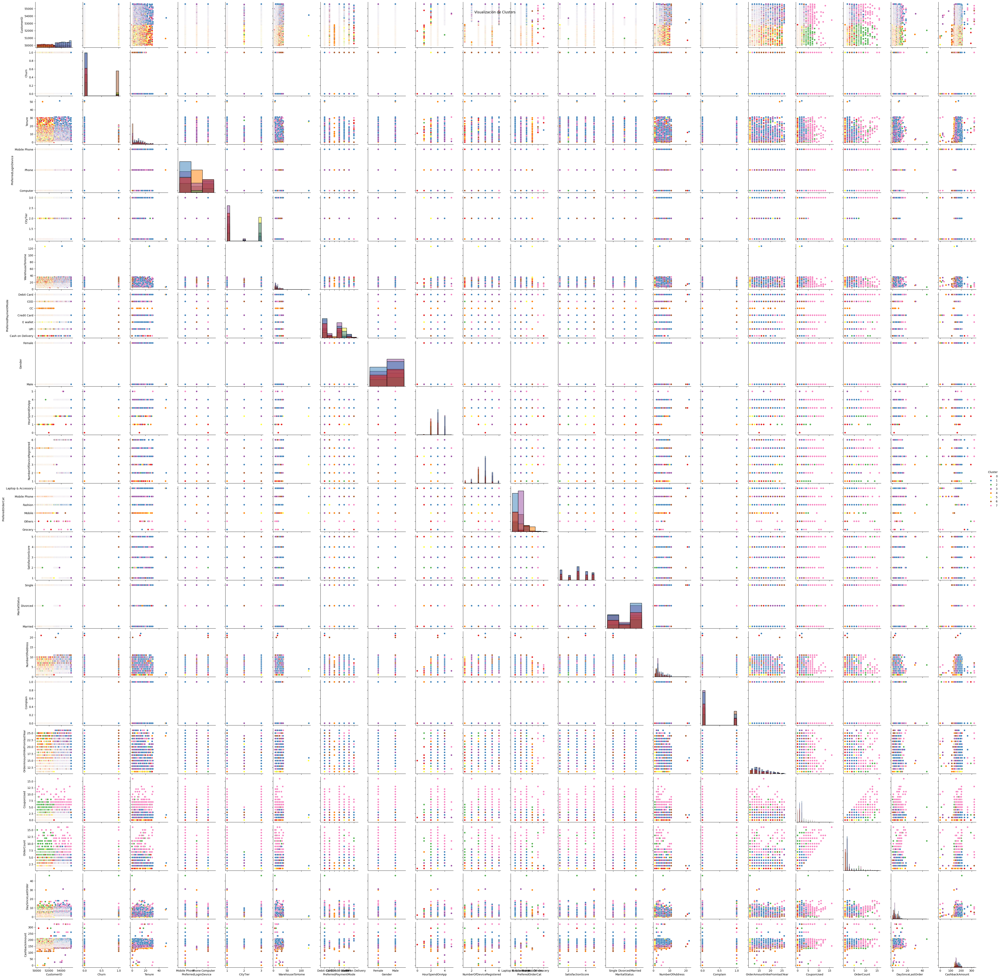

In [4]:
# Selección del número óptimo de clusters basado en los gráficos (ejemplo: n_clusters=5)
n_clusters_optimo = 8

# Aplicación de K-Means clustering con el número óptimo de clusters
kmeans = KMeans(n_clusters=n_clusters_optimo, random_state=42)
clusters = kmeans.fit_predict(Ecomm_scaled)

# Añadir los clusters al DataFrame original
Ecomm['Cluster'] = clusters

# Calcular métricas de evaluación
inertia = kmeans.inertia_
silhouette_score = metrics.silhouette_score(Ecomm_scaled, clusters)

print("Inercia del modelo de clustering:", inertia)
print("Coeficiente de silueta:", silhouette_score)

# Insights de cada cluster
cluster_centers_df = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=selected_features)
print("Centroides de cada cluster:")
print(cluster_centers_df)

# Visualización de clusters
sns.pairplot(Ecomm, hue='Cluster', vars=selected_features, diag_kind='hist', palette='Set1')
plt.suptitle('Visualización de Clusters')
plt.show()